# <center> STATIC PLOTS

##### **Import Libraries and Packages**

In [3]:
import os
os.getcwd()
os.chdir(r'C:\\Users\\melanie.vercaempt\\Documents\\Code\\train-keyrus-academy-python\\data-viz')

In [4]:
# libraries
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import numpy as np
import datetime as datetime

iris = pd.read_csv('data/iris.csv')

cars = pd.read_csv('data/auto-mpg.csv')
cars['horsepower'] = pd.to_numeric(cars['horsepower'], errors='coerce')
cars = cars.dropna(axis='rows')
countries = pd.DataFrame({'origin':[1,2,3],
                          'country': ['USA', 'Europe', 'Japan']})
cars = cars.merge(countries, on='origin')
cars = cars.drop('origin', axis='columns')

titanic = pd.read_csv('data/titanic.csv')

tips = pd.read_csv('data/tips.csv')
tips = tips.drop(['Unnamed: 0'], axis='columns')

houses = pd.read_csv('data/melb_data.csv')
houses.Date = houses['Date'].apply(lambda x: datetime.datetime.strptime(x, '%d/%m/%Y'))
houses['Month_Year'] = houses['Date'].dt.to_period('M')
houses = houses.drop(['Rooms','Method','SellerG','Distance','Bedroom2','Bathroom', 'Car', 'BuildingArea','CouncilArea','Lattitude','Longtitude','Propertycount'], axis='columns')

weather = pd.read_csv('data/weatherHistory.csv')
weather = weather.drop(['Apparent Temperature (C)','Humidity','Wind Bearing (degrees)', 'Visibility (km)','Loud Cover'], axis = 'columns')
weather['Formatted Date'] = weather['Formatted Date'].apply(lambda x: datetime.datetime.strptime(str(x)[:19], '%Y-%m-%d %H:%M:%S'))

#Life expectancy data
life = pd.read_csv('data/LifeExpectancyEU.csv')

#Geolocations 
#Import the shape file of Belgium with statistical sectors with nodes
geo_file = r'data\sh_statbel_statistical_sectors_20210101.shp'

# **1. MATPLOTLIB**

Description:
- Matplotlib is the first plotting library
- Most popular and widely-used Python package for visualisations
- Based on Matlab

Strengths and Weaknesses:
- Strengths
    - Easy to understand
    - Designed like MatLab: switching was easy
    - Many rendering backends 
    - Can reproduce just about any plot with a bit of effort 
    - Well-tested, standard tool for over a decade 
- Weaknesses
    - Not ideal for 3D plotting
    - Sometimes poor stylistic defaults 
    - Poor support for web/interactive graphs 
    - Often slow for large & complicated data
    - Not ideal for time series
    - Relies significantly on other Python libraries like NumpY
    
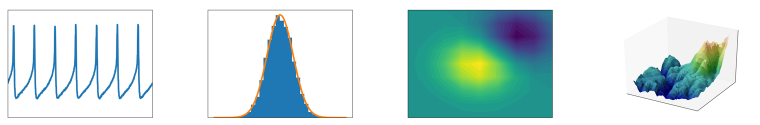


Many libraries want to keep matplotlib's strengths and get rid of its weaknesses. One solution is thus to build on top of matplotlib. 

Doc: https://matplotlib.org/contents.html

## **1.1 Cheat Sheet**

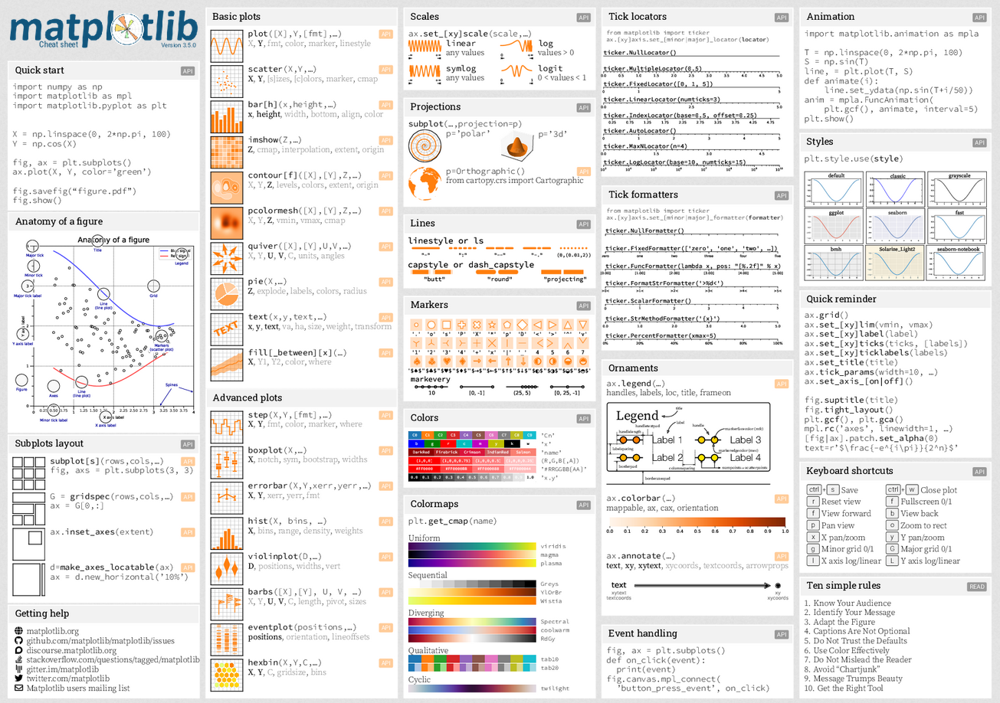

https://matplotlib.org/cheatsheets/_images/cheatsheets-1.png

In [5]:
# imports
import matplotlib.pyplot as plt

## **1.2 Basic Plots**

#### **1.2.1 Scatter plot**

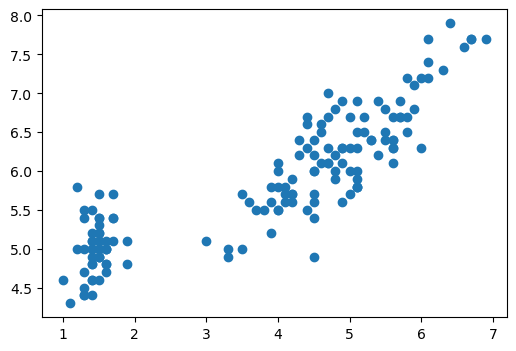

In [6]:
# MATPLOTLIB - Scatter plot
fig, ax = plt.subplots(figsize=(6,4)) 
plt.scatter(iris['petalLength'], iris['sepalLength'])

Text(0, 0.5, 'sepalLength')

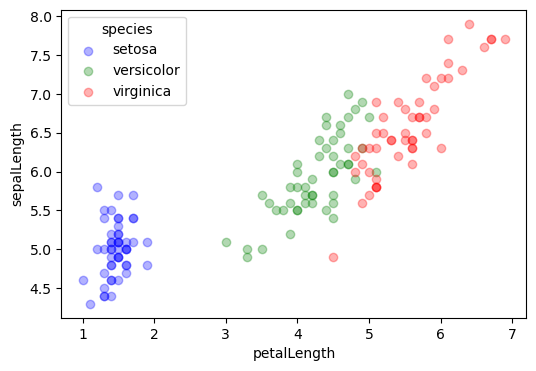

In [7]:
# MATPLOTLIB - Scatter plot by group
fig, ax = plt.subplots(figsize=(6,4))
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
for species, group in iris.groupby('species'):
    ax.scatter(group['petalLength'], group['sepalLength'],
                color=color_map[species],
                alpha=0.3, edgecolor=None,
                label=species)
plt.legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength')

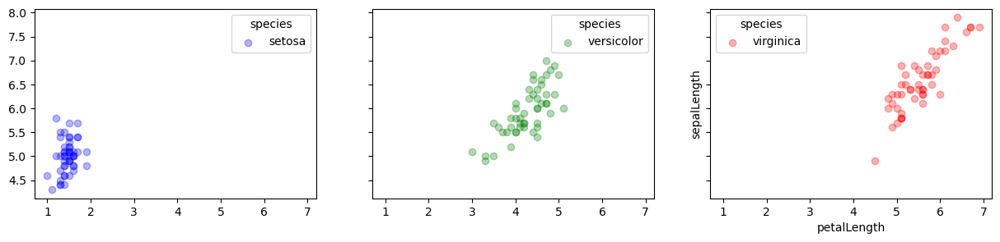

In [8]:
# MATPLOTLIB - Scatter plot by group with facets
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
n_panels = len(color_map)
fig, ax = plt.subplots(1, n_panels, figsize=(n_panels * 5, 3),
                       sharex=True, sharey=True)
for i, (species, group) in enumerate(iris.groupby('species')):
    ax[i].scatter(group['petalLength'], group['sepalLength'],
                  color=color_map[species],
                  alpha=0.3, edgecolor=None,
                  label=species)
    ax[i].legend(frameon=True, title='species')
plt.xlabel('petalLength')
plt.ylabel('sepalLength')

**Aesthetics**

Text(0.5, 1.0, 'Petal Lengths vs. Sepal Lengths')

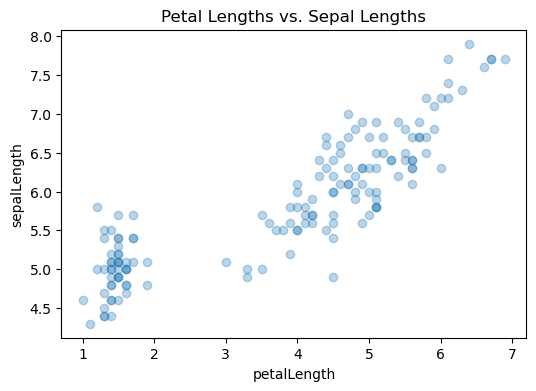

In [9]:
# MATPLOTLIB - Scatter plot
fig, ax = plt.subplots(figsize=(6,4)) 
plt.scatter(iris['petalLength'], iris['sepalLength'], alpha=0.3)
plt.xlabel('petalLength')
plt.ylabel('sepalLength')
plt.title('Petal Lengths vs. Sepal Lengths')

#### **1.2.2 Line chart**

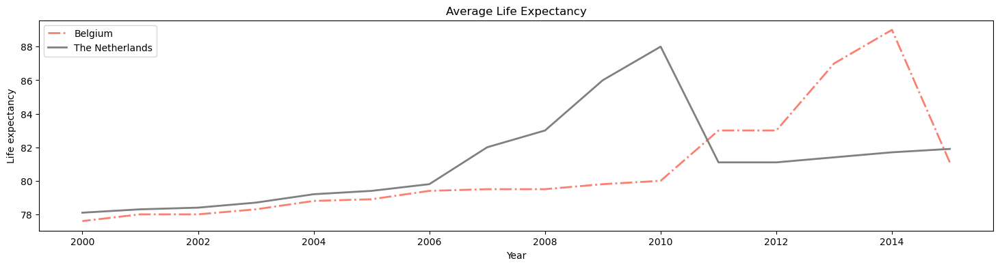

In [10]:
fig, ax = plt.subplots(figsize=(18,4)) #subplots(rows,columns)

x1 = life[life['Country'] == 'Belgium']['Year']
y1 = life[life['Country'] == 'Belgium']['Life expectancy']

x2 = life[life['Country'] == 'Netherlands']['Year']
y2 = life[life['Country'] == 'Netherlands']['Life expectancy']

ax.plot(x1,y1, linewidth=2.0, color = 'Salmon', ls = "-.", label= 'Belgium')
ax.plot(x2,y2, linewidth=2.0, color = 'Grey', ls = "-", label = 'The Netherlands')

ax.legend()
ax.set_ylabel('Life expectancy')
ax.set_xlabel('Year')

plt.title('Average Life Expectancy')
plt.show()

#### **1.2.3 Bar chart**

ax.bar(x, height, width, bottom, align)

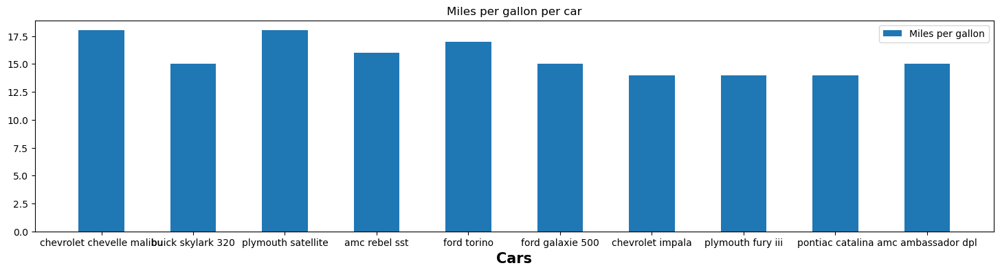

In [11]:
fig, ax = plt.subplots(figsize=(18,4)) #subplots(rows,columns)

name = cars['car_name'].head(12)
mpg = cars['mpg'].head(12)

plt.bar(name[0:10], mpg[0:10], width = 0.5, label = 'Miles per gallon')
plt.title('Miles per gallon per car')

plt.xlabel('Cars', fontweight ='bold', fontsize = 15)
plt.legend()
plt.show()

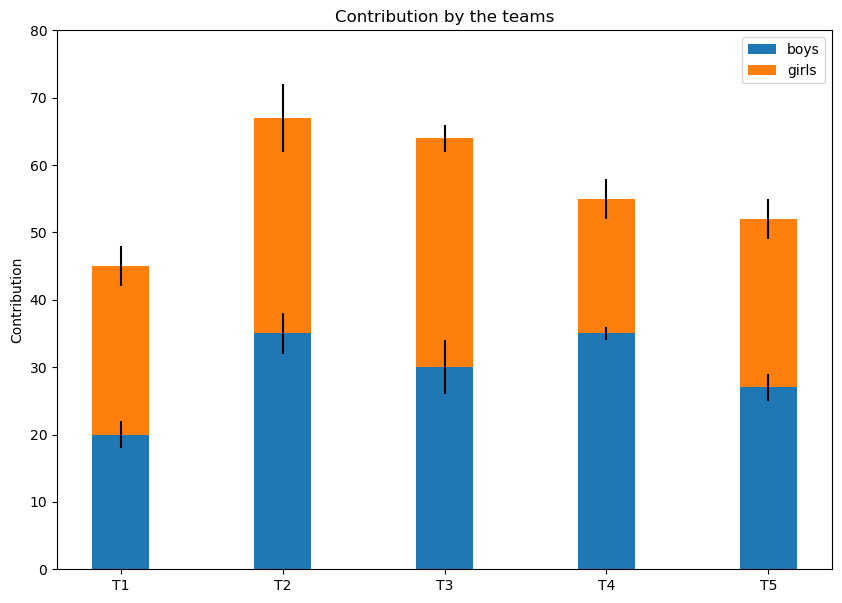

In [12]:
N = 5
 
boys = (20, 35, 30, 35, 27)
girls = (25, 32, 34, 20, 25)
boyStd = (2, 3, 4, 1, 2)
girlStd = (3, 5, 2, 3, 3)
ind = np.arange(N)  
width = 0.35 
 
fig = plt.subplots(figsize =(10, 7))

p1 = plt.bar(ind, boys, width, yerr = boyStd)
p2 = plt.bar(ind, girls, width,
             bottom = boys, yerr = girlStd)
 
plt.ylabel('Contribution')
plt.title('Contribution by the teams')
plt.xticks(ind, ('T1', 'T2', 'T3', 'T4', 'T5'))
plt.yticks(np.arange(0, 81, 10))
plt.legend((p1[0], p2[0]), ('boys', 'girls'))
 
plt.show()

## **1.3 Advanced Plots**

#### **1.3.1 Boxplot**

plt.boxplot(data, notch=None, vert=None, patch_artist=None, widths=None)

{'whiskers': [<matplotlib.lines.Line2D at 0x1a8c45419f0>,
 'caps': [<matplotlib.lines.Line2D at 0x1a8c47b6a40>,
 'boxes': [<matplotlib.lines.Line2D at 0x1a8c4541e10>],
 'medians': [<matplotlib.lines.Line2D at 0x1a8c47b6860>],
 'fliers': [<matplotlib.lines.Line2D at 0x1a8c47b6530>],
 'means': []}

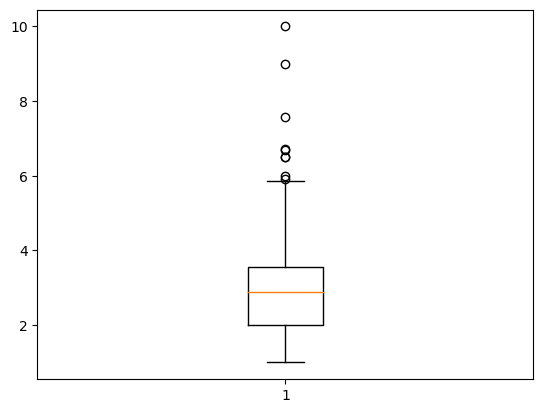

In [13]:
plt.boxplot(tips[['tip']])

Text(0.5, 1.0, 'Boxplot')

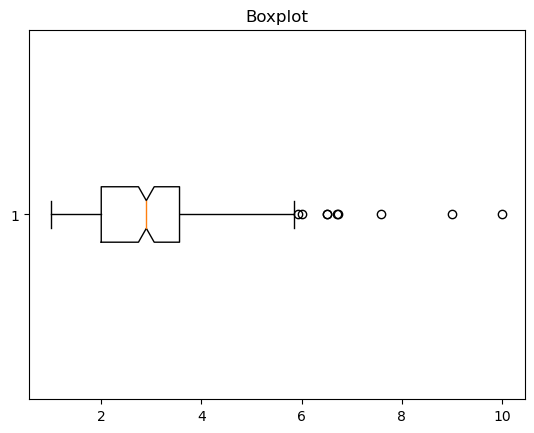

In [14]:
plt.boxplot(tips[['tip']], notch = True, vert=False)
plt.title('Boxplot')

#### **1.3.2 Histogram**

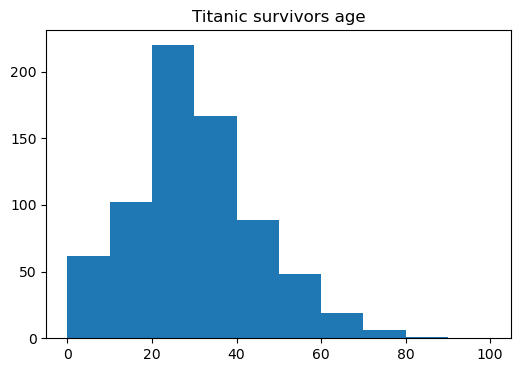

In [15]:
fig, ax = plt.subplots(figsize =(6, 4))
ax.hist(titanic.age, bins = [0,10,20,30,40,50,60,70,80,90,100])
plt.title('Titanic survivors age')
plt.show()

C:\Users\melanie.vercaempt\AppData\Local\Temp\ipykernel_19088\1372042733.py:19: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs.grid(b = True, color ='grey',


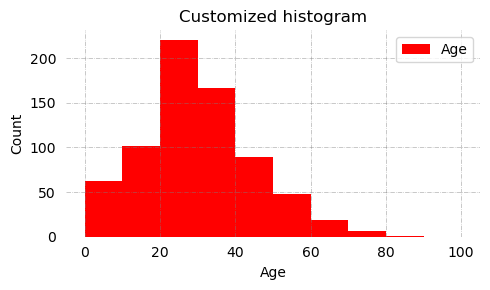

In [16]:
from matplotlib import colors
from matplotlib.ticker import PercentFormatter

# Creating histogram
fig, axs = plt.subplots(1, 1,
                        figsize =(5, 3),
                        tight_layout = True)
legend = ['Age']

# Remove axes splines
for s in ['top', 'bottom', 'left', 'right']:
    axs.spines[s].set_visible(False)
    
# Remove x, y ticks
axs.xaxis.set_ticks_position('none')
axs.yaxis.set_ticks_position('none')

# Add x, y gridlines
axs.grid(b = True, color ='grey',
        linestyle ='-.', linewidth = 0.5,
        alpha = 0.6)

# Creating histogram
N, bins, patches = axs.hist(titanic.age, bins = [0,10,20,30,40,50,60,70,80,90,100], color = 'red')


# Adding extra features   
plt.xlabel("Age")
plt.ylabel("Count")
plt.legend(legend)
plt.title('Customized histogram')
 
# Show plot
plt.show()

## **1.3 Exercises**

**Exercise 1**
    
Plot the evolution of horsepower per year from the car dataset. [cars]

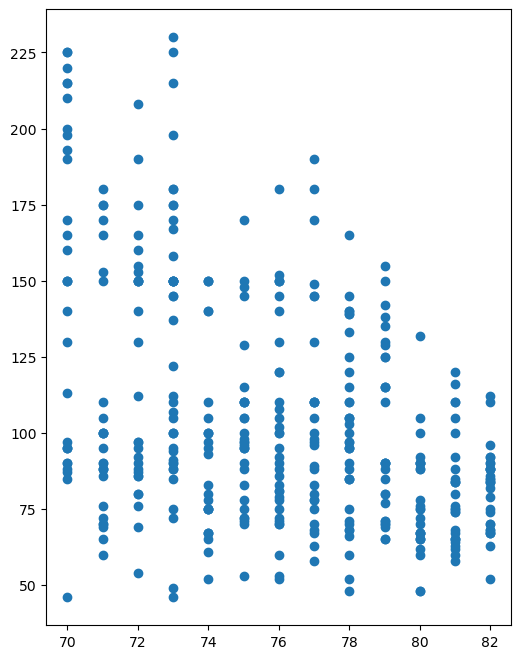

In [17]:
fig, ax = plt.subplots(figsize=(6,8)) 
plt.scatter(cars['model_year'], cars['horsepower'])

**Exercise 2** 

Plot the evolution of horsepower per year by cylinders from the car dataset. [cars]

Text(0, 0.5, 'Horspower')

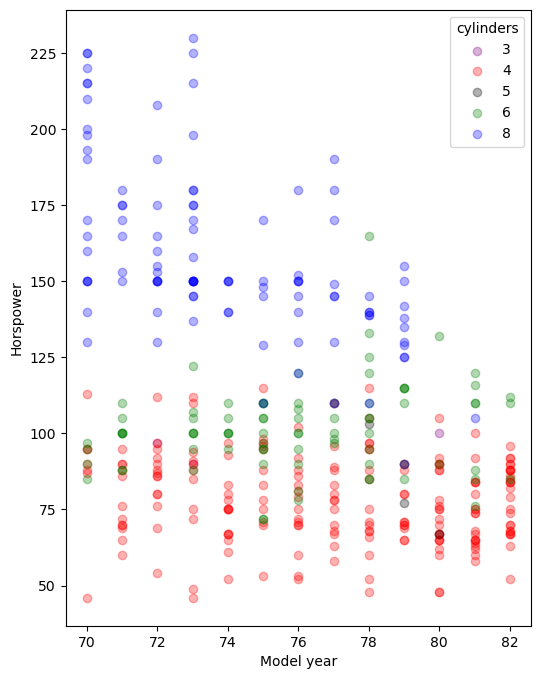

In [18]:
fig, ax = plt.subplots(figsize=(6,8))
color_map = dict(zip(cars.cylinders.unique(),
                     ['blue', 'green', 'red', 'purple', 'black']))
for cylinders, group in cars.groupby('cylinders'):
    plt.scatter(group['model_year'], group['horsepower'],
                color=color_map[cylinders],
                alpha=0.3, edgecolor=None,
                label=cylinders)
plt.legend(frameon=True, title='cylinders')
plt.xlabel('Model year')
plt.ylabel('Horspower')

**Exercise 3**

Plot the evolution of the temperature of the last day (31/12/2016) of the weather dataset. [weather]

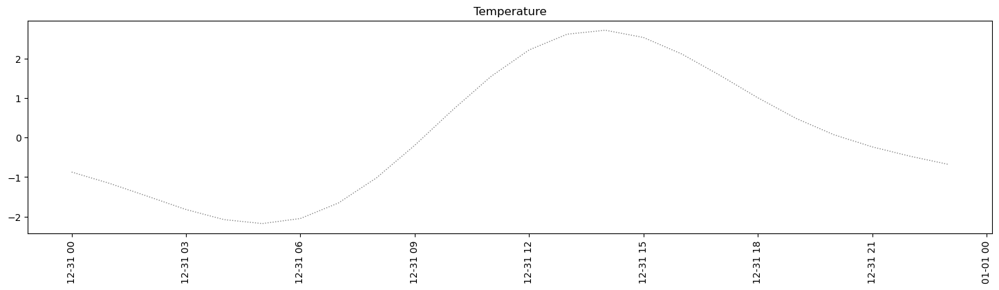

In [19]:
fig, ax = plt.subplots(figsize=(18,4)) #subplots(rows,columns)

weather_2016 = weather[weather['Formatted Date'] >= '2016-12-31']
x = weather_2016['Formatted Date']
y = weather_2016['Temperature (C)']
ax.plot(x,y, linewidth=1.0, color = 'Grey', ls = ":")

plt.xticks(rotation=90)

plt.title('Temperature')
plt.show()

# **2. PANDAS**

Pandas is not a data visualisation library but it is capable of creating basic plots. Pandas is highly useful and practical for creating plots for explanatory analysis.

Description:
- Based on matplotlib
- Built within the pandas DataFrame library
- Simple API for plotting
- Recently added more sophisticated statictical visualisation tools (e.g. andrews_curves)

Strengths and Weaknesses:
- Strengths
    - Quick and dirty for simple plots
- Weaknesses
    - Not easy to groupby/color/facet
    
Doc: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html

**Imports**

In [20]:
import pandas as pd

## **2.1 Basic Plots**

#### **2.1.1 Scatter plot**

<AxesSubplot:xlabel='petalLength', ylabel='petalWidth'>

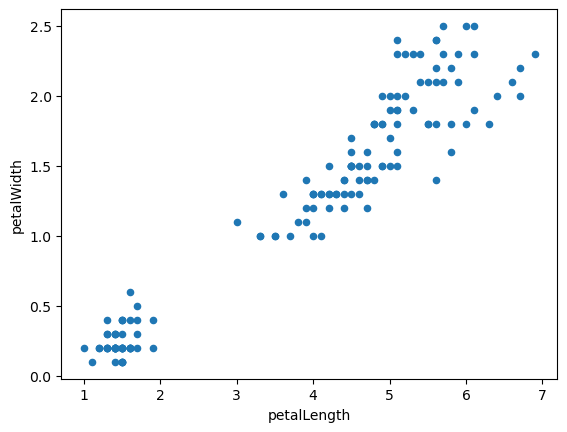

In [21]:
# Scatter plot
iris.plot.scatter(x='petalLength', y='petalWidth')

<AxesSubplot:title={'center':'Scatterplot of Iris'}, xlabel='petalLength', ylabel='petalWidth'>

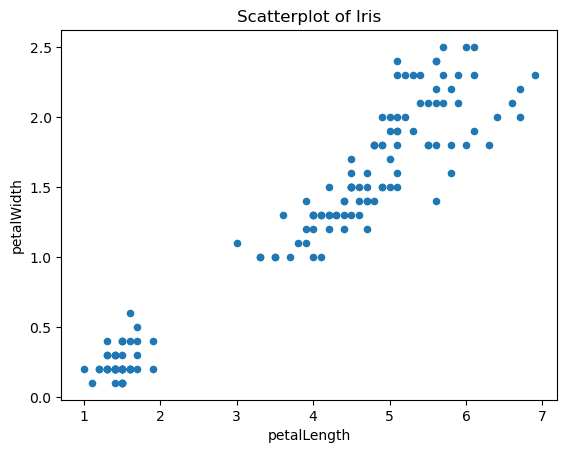

In [22]:
iris.plot(kind = 'scatter', x = 'petalLength', y = 'petalWidth', title = 'Scatterplot of Iris')

Text(0, 0.5, 'sepalLength')

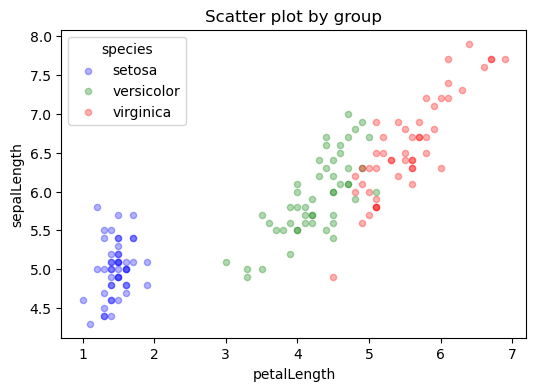

In [23]:
# Scatter plot by group
fig, ax = plt.subplots(figsize=(6,4))
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
for species, group in iris.groupby('species'):
    group.plot.scatter('petalLength', 'sepalLength',
                       color=color_map[species],
                       alpha=0.3, edgecolor=None,
                       label=species, ax = ax)
plt.legend(frameon=True, title='species')
plt.title('Scatter plot by group')
plt.xlabel('petalLength')
plt.ylabel('sepalLength')

Text(0, 0.5, 'sepalLength')

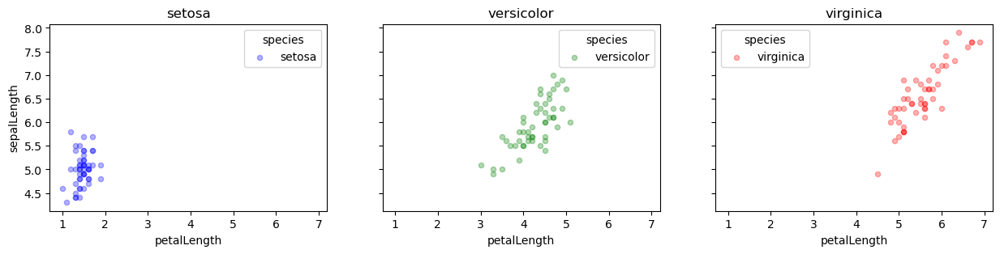

In [24]:
#Clean - Scatter plot by group with facets
color_map = dict(zip(iris.species.unique(),
                     ['blue', 'green', 'red']))
n_panels = len(color_map)
fig, ax = plt.subplots(1, n_panels, figsize=(n_panels * 5, 3),
                       sharex=True, sharey=True)

for i, (species, group) in enumerate(iris.groupby('species')):
    group.plot.scatter('petalLength', 'sepalLength',
                       color=color_map[species],
                       alpha=0.3, edgecolor=None,
                       label=species,
                       ax = ax[i],
                       title = species)
    ax[i].legend(frameon=True, title='species')
    
plt.xlabel('petalLength')
plt.ylabel('sepalLength')

Text(0.5, 1.0, 'Petal Lengths vs. Sepal Lengths')

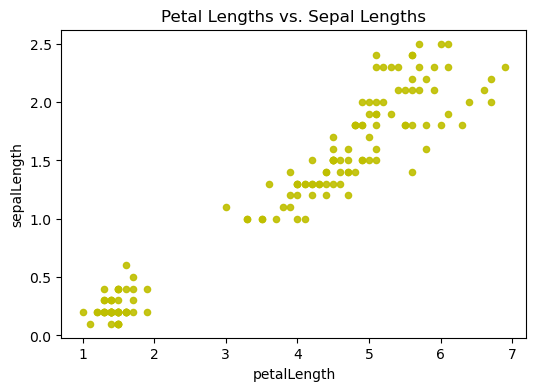

In [25]:
# PANDAS - Scatter plot - Aestethics
fig, ax = plt.subplots(figsize=(6,4))
iris.plot.scatter(x = 'petalLength', y = 'petalWidth', alpha = 0.9, ax = ax, c='y')
plt.xlabel('petalLength')
plt.ylabel('sepalLength')
plt.title('Petal Lengths vs. Sepal Lengths')

#### **2.1.2 Linechart**

<AxesSubplot:title={'center':'Life expectancy of Finland'}, xlabel='Year'>

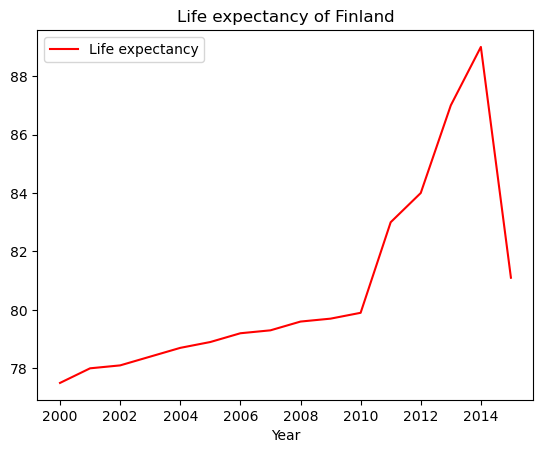

In [26]:
life[life['Country'] == 'Finland'].plot(x = 'Year', y = 'Life expectancy', title = 'Life expectancy of Finland', color = 'red')

#### **2.1.3 Bar chart**

<AxesSubplot:title={'center':'Sum of tips per gender'}, xlabel='sex'>

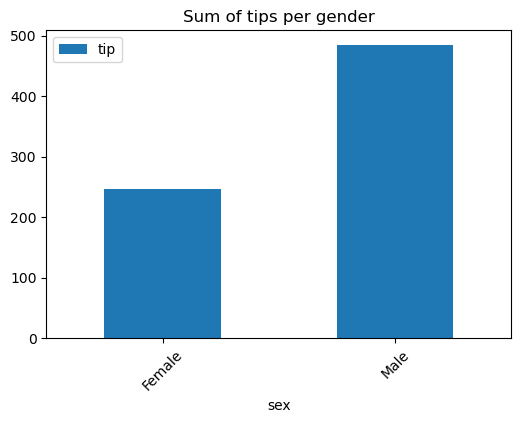

In [27]:
tips[['sex', 'tip']].groupby('sex').sum().plot.bar(figsize = (6,4), rot=45, title = 'Sum of tips per gender')

## **2.2 Advanced Plots**

#### **2.2.1 Boxplot**

<AxesSubplot:title={'center':'tip'}, xlabel='sex'>

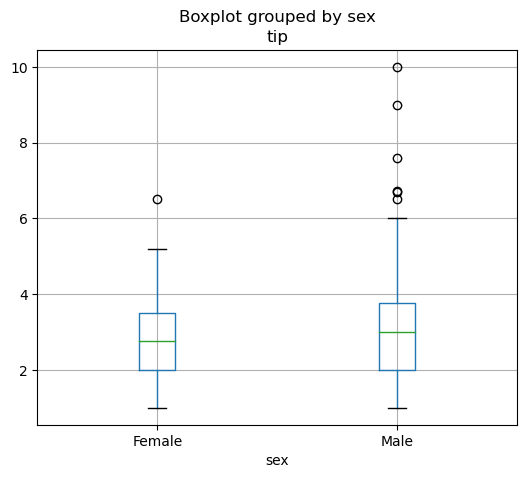

In [28]:
tips[['sex', 'tip']].boxplot(column = 'tip', by = 'sex', figsize=(6,5))

#### **2.2.2 Histogram**

array([[<AxesSubplot:title={'center':'age'}>]], dtype=object)

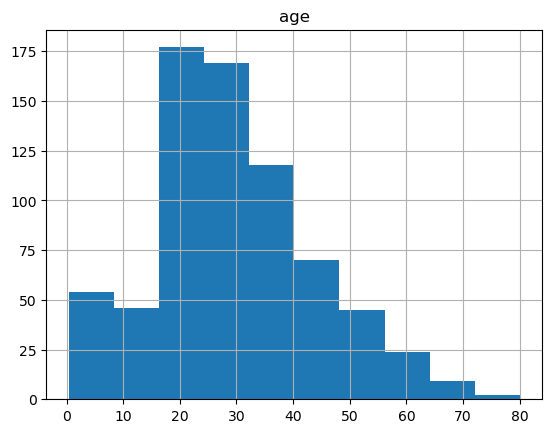

In [29]:
titanic[['age']].hist(sharey=True, sharex = True)

<AxesSubplot:title={'center':'Histogram of age'}, ylabel='Frequency'>

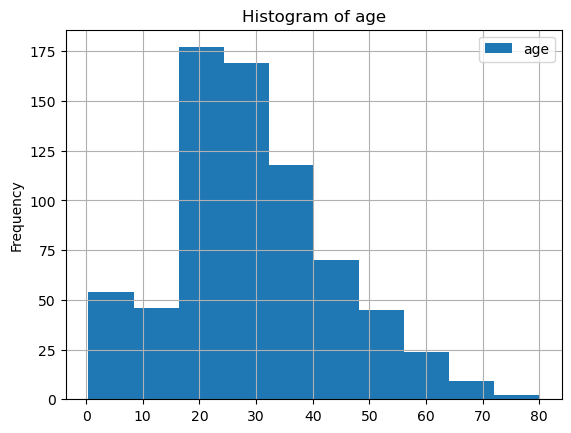

In [30]:
titanic[['age']].plot(kind = 'hist', title = 'Histogram of age', grid = True)

#### **2.2.3 Andrew Curve**

<AxesSubplot:>

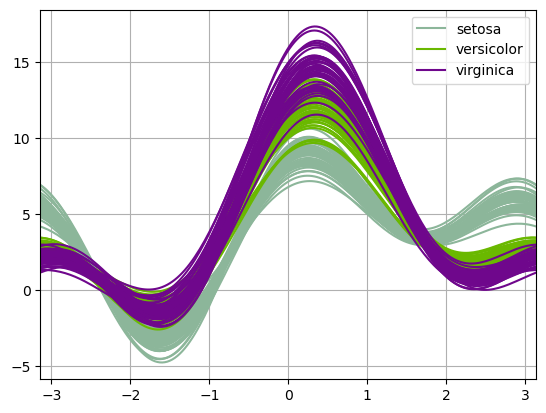

In [31]:
pd.plotting.andrews_curves(iris, 'species')

*What is Andrew Curves?*
<br> These curves have been utilized in fields as different as biology, neurology, sociology and semiconductor manufacturing. Some of their uses include the quality control of products, the detection of period and outliers in time series, the visualization of learning in artificial neural networks, and correspondence analysis.

## **2.3 Exercises**

**Exercise 1**

Plot the acceleration vs. horsepower of the cars dataset. [cars]

<AxesSubplot:xlabel='horsepower', ylabel='acceleration'>

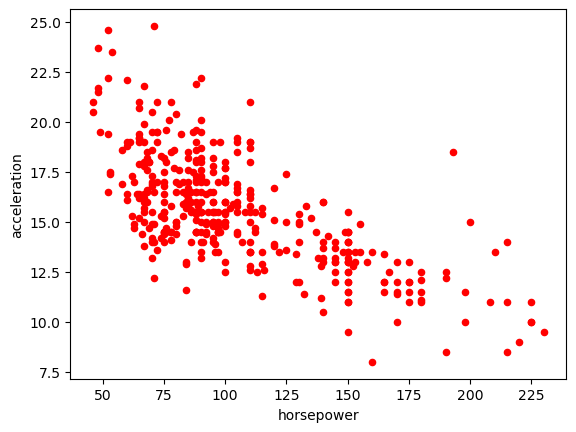

In [34]:
cars.plot.scatter('horsepower', 'acceleration', c='r')

**Excercise 2**

Plot the distribution of acceleration of cars. [cars]

<AxesSubplot:title={'center':'Distribution of Acceleration of cars'}, ylabel='Frequency'>

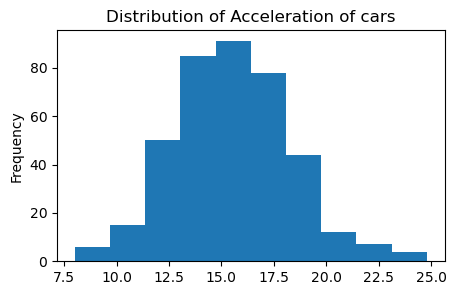

In [35]:
cars['acceleration'].plot(kind = 'hist', figsize=(5,3), title = 'Distribution of Acceleration of cars')

**Excercise 3**
Plot the boxplot of prices of houses per type. [houses]

<AxesSubplot:title={'center':'Price'}, xlabel='Type'>

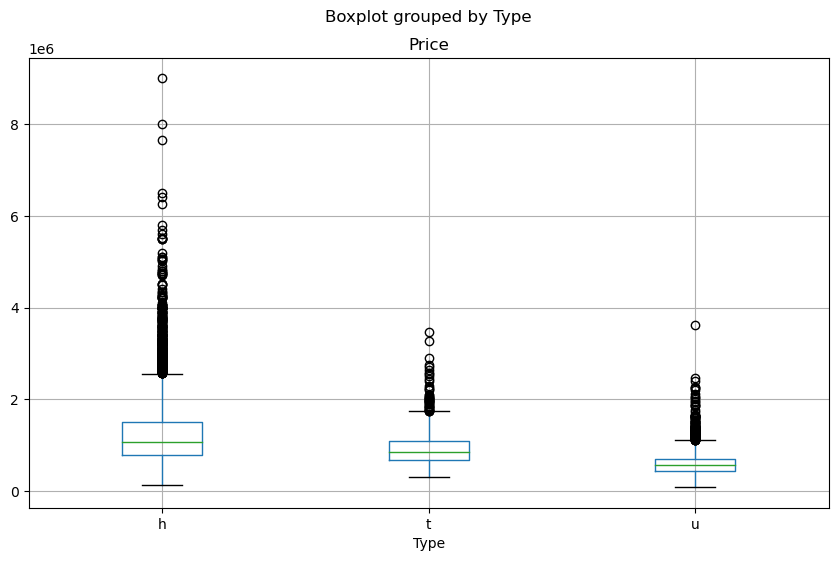

In [37]:
houses.boxplot(column= 'Price', by='Type', figsize=(10,6))

# **3. SEABORN**

Description:
- Extends on matplotlib
- Focus on statistical visualisation and modeling
- Towards declarative programming

Strengths and Weaknesses:
- Strengths
    - Allows working with DataFrames
    - Nice statistical tools
    - Visualizing univariate and bivariate data, plotting time series data, etc.
    - High-level programming
    - Nice color palettes and styles
    - Well documented and widely used
- Weaknesses
    - Not included in Python 
    - No interactive visualisations

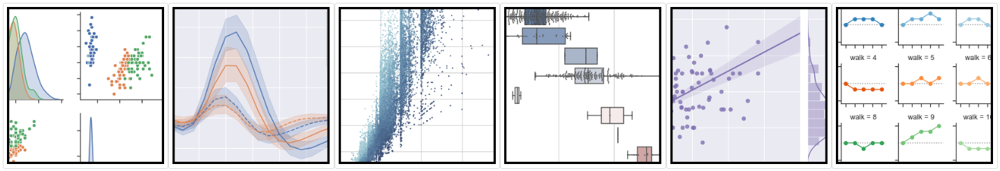

doc: https://seaborn.pydata.org/api.html

## **3.1 Cheat Sheet**

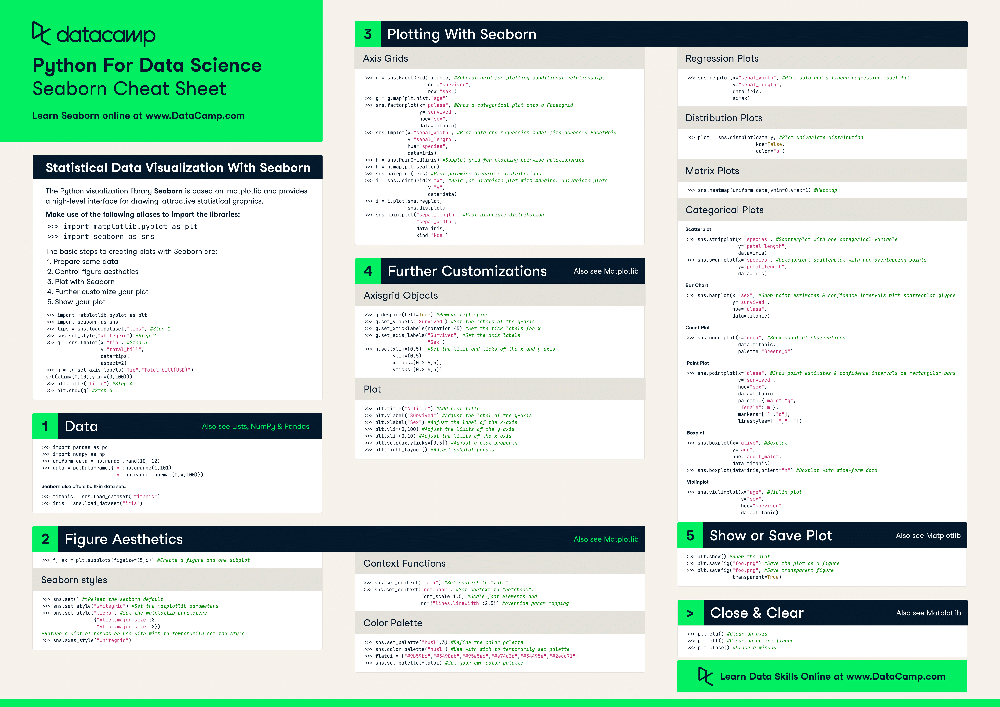

https://www.datacamp.com/cheat-sheet/python-seaborn-cheat-sheet

In [38]:
# imports
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

## **3.2 Basic Plots**

#### **3.2.1 Scatter plot**

Text(0, 0.5, 'Sepal Length (cm)')

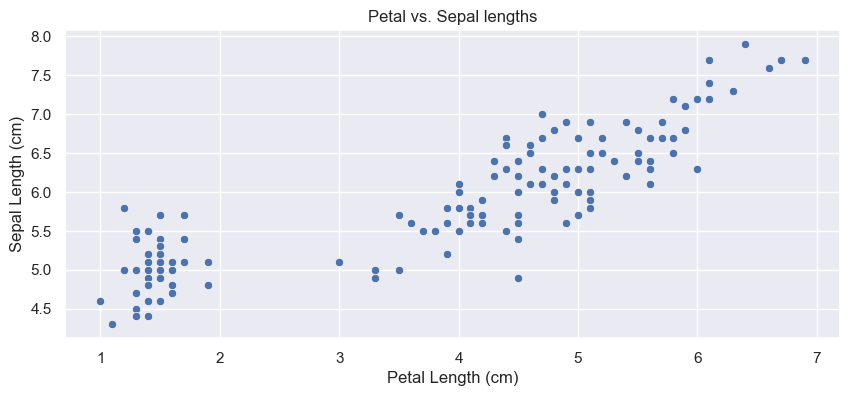

In [39]:
# SEABORN - Scatter plot
fig, ax = plt.subplots(figsize=(10,4))
plt.title('Petal vs. Sepal lengths')

ax = sns.scatterplot(x="petalLength", y="sepalLength", data=iris)

plt.xlabel('Petal Length (cm)')
plt.ylabel('Sepal Length (cm)')

Text(0, 0.5, 'Sepal Length (cm)')

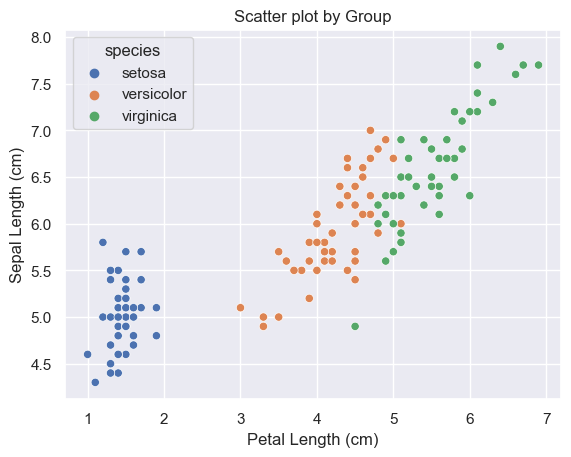

In [40]:
# SEABORN - Scatter plot by group
ax = sns.scatterplot(x='petalLength', y='sepalLength', hue='species', data=iris)
plt.title('Scatter plot by Group')
plt.xlabel('Petal Length (cm)')
plt.ylabel('Sepal Length (cm)')

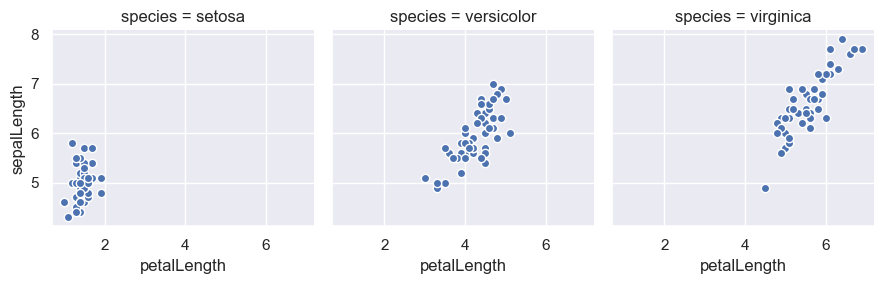

In [41]:
# SEABORN - Scatter plot by group with facets
g = sns.FacetGrid(iris, col="species")
g = g.map(plt.scatter, "petalLength", "sepalLength", edgecolor="w")

#### **3.2.2 Count plot**

Text(0.5, 1.0, 'Count of people per class')

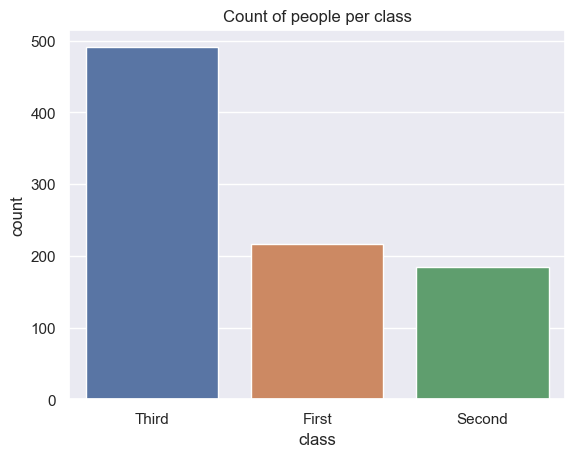

In [42]:
ax=sns.countplot(x = 'class', data = titanic)
plt.title('Count of people per class')

#### **Aestethics**

In [43]:
sns.set_palette('husl',3)

In [44]:
#choose your own color palette: https://htmlcolorcodes.com/
flatui = ['#aed6f1', '#ebdef0', '#f9e79f']
sns.set_palette(flatui)

Text(0.5, 1.0, 'Count of people per class')

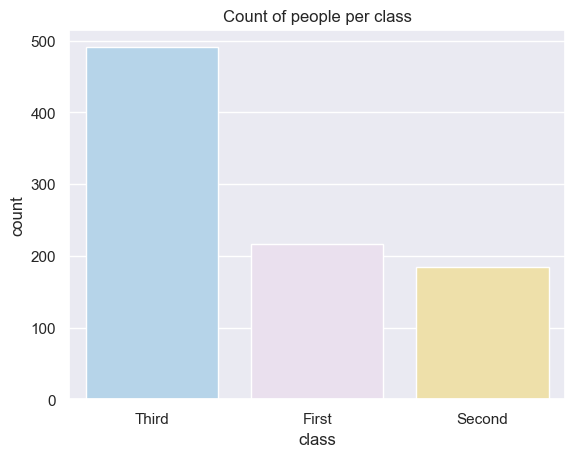

In [45]:
ax=sns.countplot(x = 'class', data = titanic)
plt.title('Count of people per class')

## **3.3 Advanced Plots**

#### **3.3.1 Pointplot**

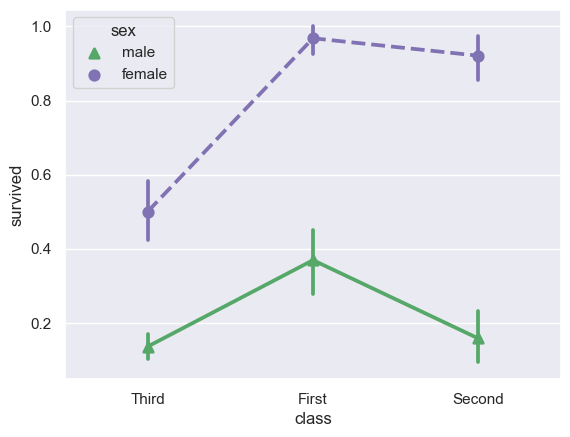

In [46]:
ax = sns.pointplot(x = 'class', y = 'survived', hue = 'sex', data = titanic, palette = {"male" : "g", "female": "m"}, markers = ["^", "o"], linestyles= ["-", "--"])

#### **3.3.2 Violin Plot**

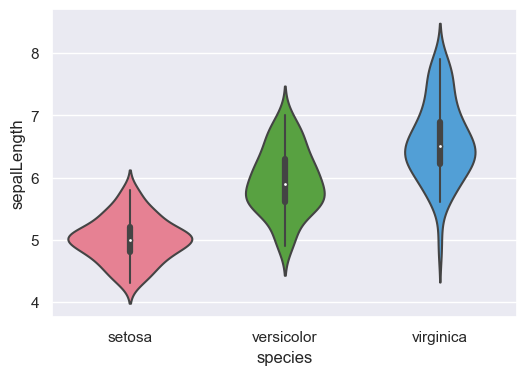

In [47]:
sns.set_palette('husl',3) 

fig, ax = plt.subplots(figsize=(6,4))
ax = sns.violinplot(x="species", y="sepalLength", data=iris)

#### **3.2.3 Pairplot**

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

https://medium.com/analytics-vidhya/pairplot-visualization-16325cd725e6

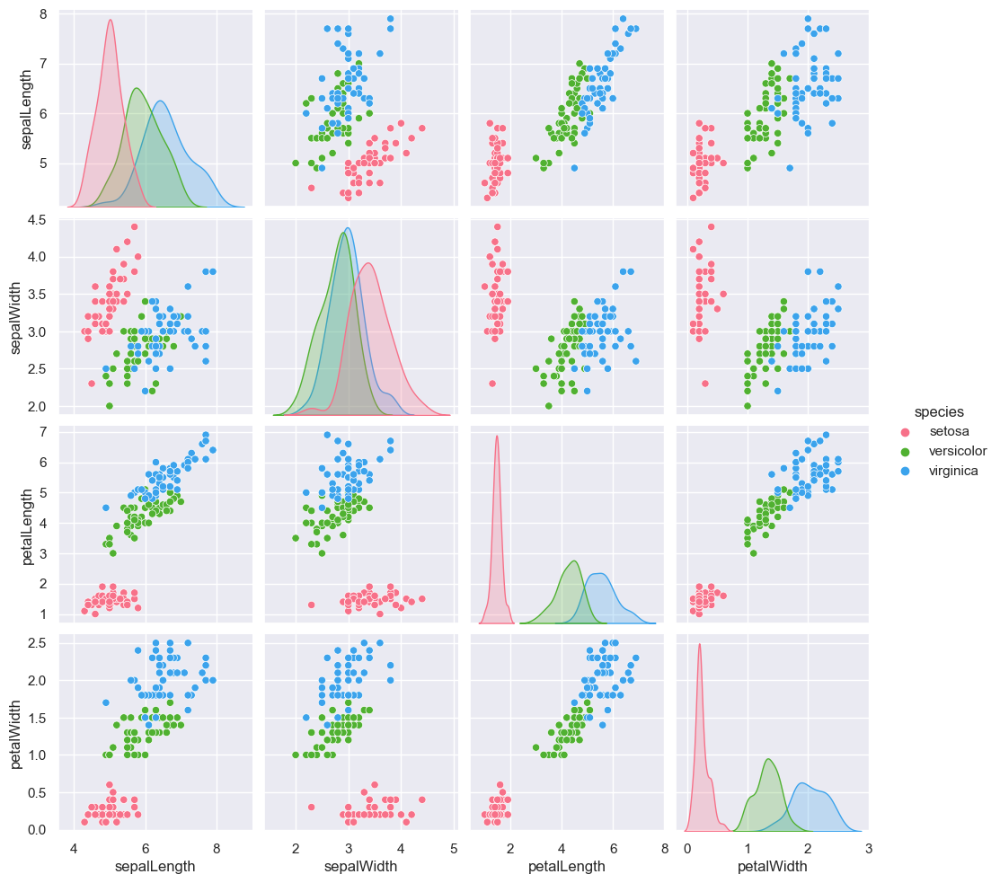

In [48]:
ax = sns.pairplot(hue='species', data=iris)

#### **3.2.4 Heatmap**

<AxesSubplot:>

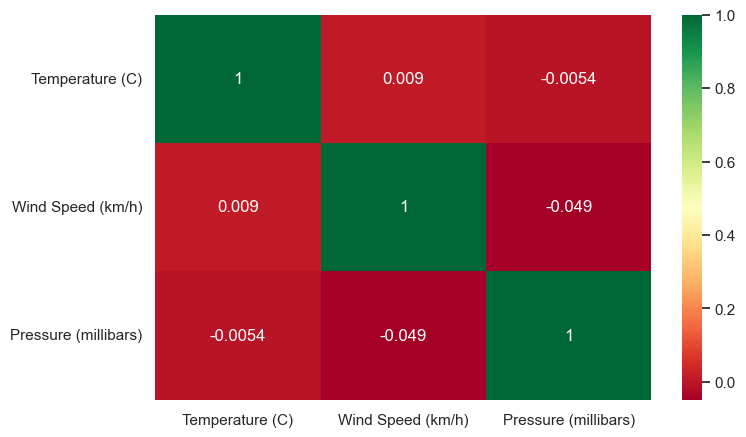

In [49]:
plt.figure(figsize = (8,5))

sns.heatmap(weather.corr(),cmap="RdYlGn",annot=True)

## **3.4 Exercises**

**Exercise 1**

Make a pairplot of all the variables in cars with regard to origin country.[cars]

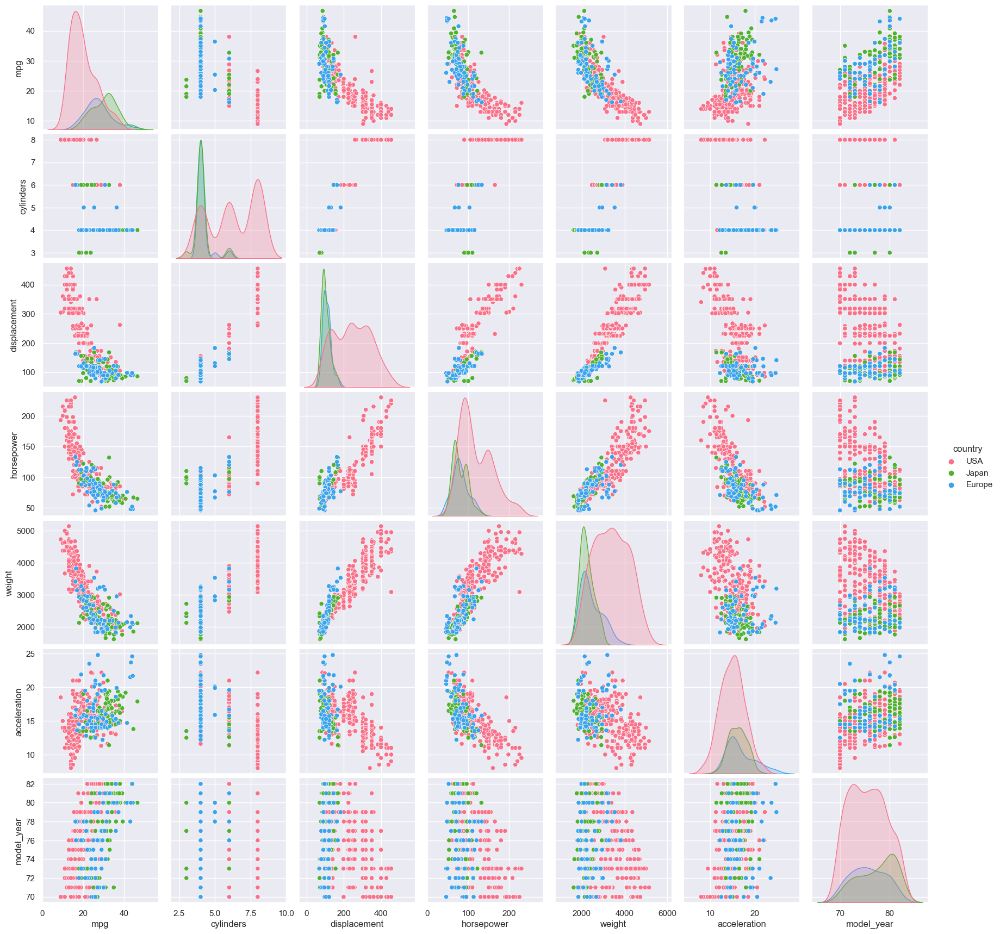

In [50]:
sns.pairplot(cars, hue = 'country')

**Exercise 2**

Plot the weight vs horsepower and add a linear regression along the points.[cars]

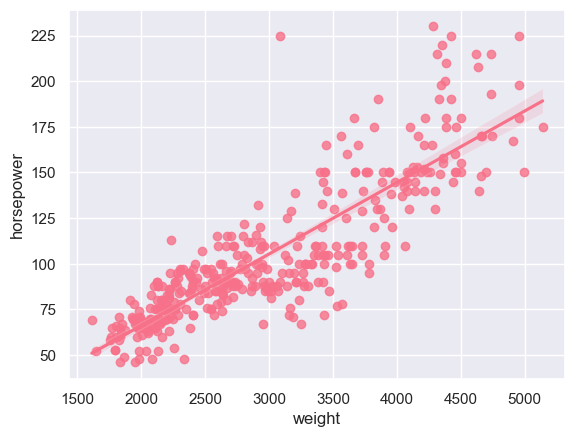

In [51]:
ax = sns.regplot(x="weight", y="horsepower", data=cars)

<AxesSubplot:xlabel='weight', ylabel='horsepower'>

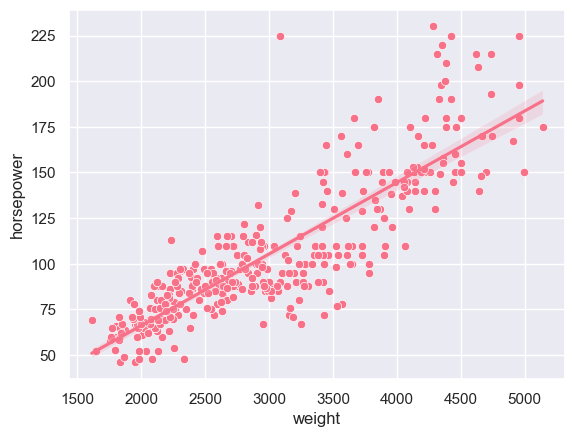

In [52]:
fig, ax = plt.subplots()
sns.scatterplot(x="weight", y="horsepower", data=cars, ax=ax)
sns.regplot(x="weight", y="horsepower", data=cars, scatter=False, ax=ax)

**Exercise 3**

Build a bar plot with the count of rows per cylinder. [cars]

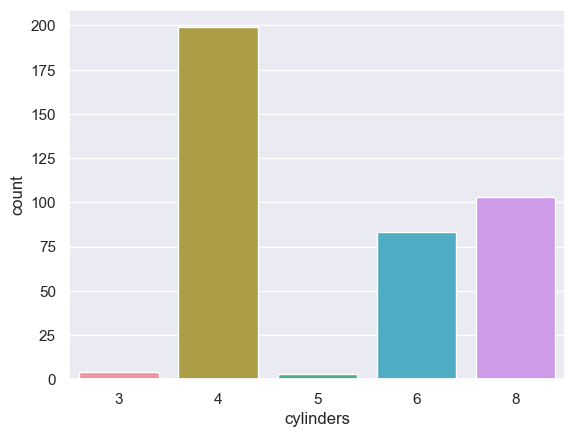

In [53]:
ax = sns.countplot(x="cylinders", data=cars)
# OR
# ax = sns.barplot(x="cylinders", y="mpg", data=cars, estimator=np.size)

**Exercise 4**

Build a bar plot with the average of horsepower per year. [cars]

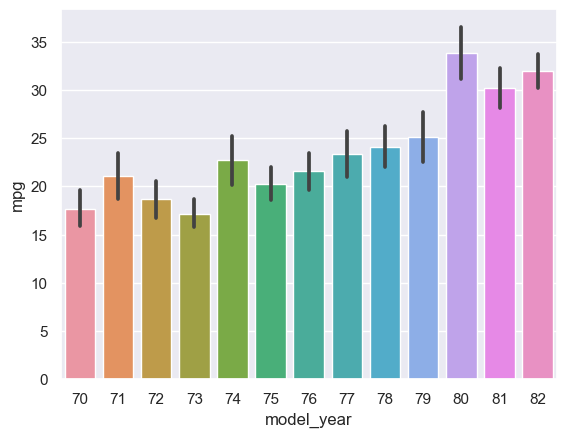

In [54]:
ax = sns.barplot(x="model_year", y="mpg", data=cars, estimator=np.mean)

**Exercise 5**

Build a violin plot showing the difference of total_bill between smoker/non-smoker by day.
tip: you can use ```split=True``` [tips]

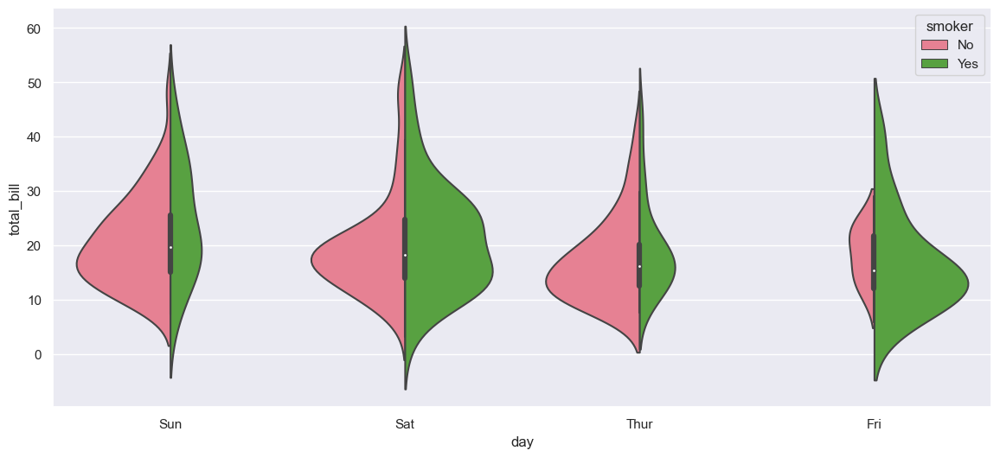

In [55]:
fig, ax = plt.subplots(figsize=(14,6))
ax = sns.violinplot(x="day", y="total_bill", hue="smoker", data=tips, split=True, scale='count')

# **4. PLOTNINE**
Description:
- Based on matplotlib
- Same calls as with the R package ggplot2

Strengths and Weaknesses:
- Strengths
    - No need to learn new package if you know ggplot2
    - Add Geometries layers
- Weaknesses
    - Small community
    - Some quirks and bugs
    
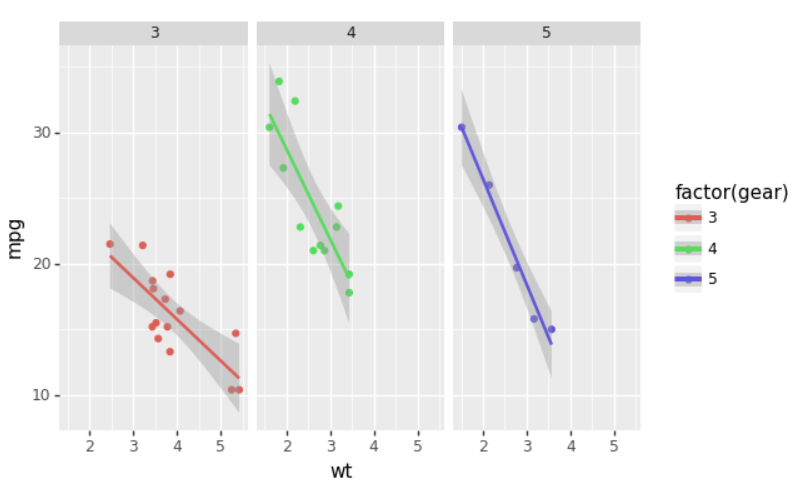

Doc: https://plotnine.readthedocs.io/en/stable/

https://datacarpentry.org/python-ecology-lesson/07-visualization-ggplot-python/index.html

## **4.1 Cheat Sheet (RStudio)**

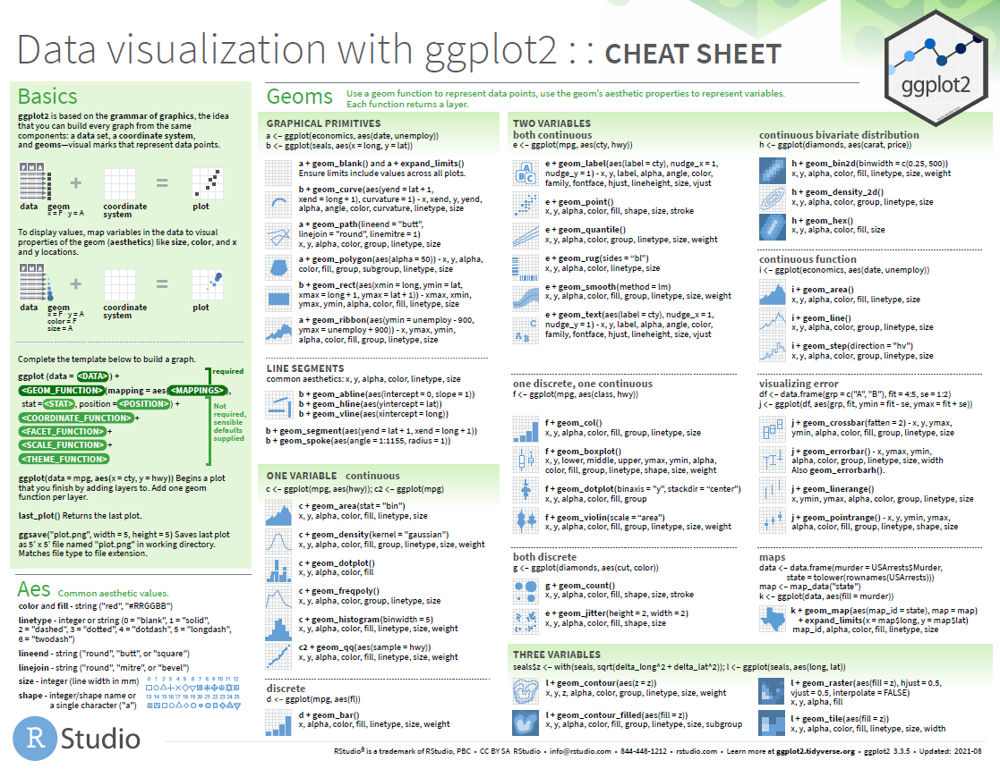

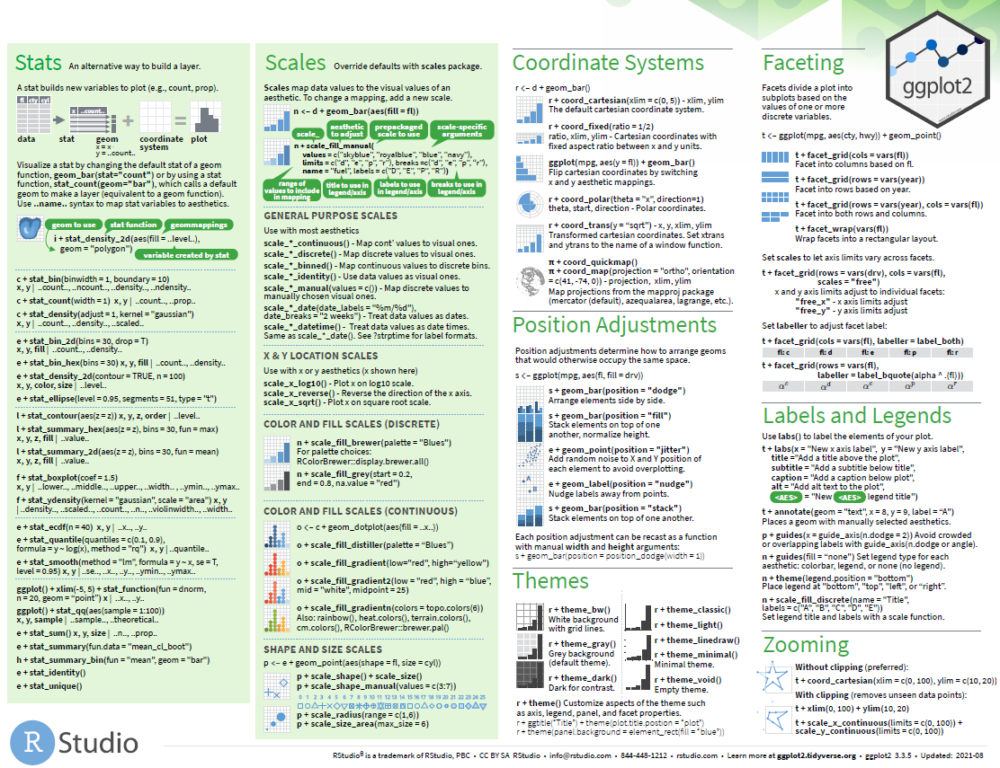

**Imports**

In [56]:
import plotnine as pn

## **4.2 Basic Plots**

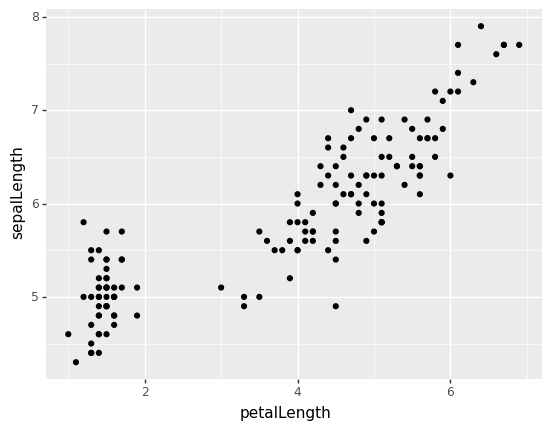

<ggplot: (114040937277)>

In [57]:
#Step by step
(pn.ggplot(data=iris)) # As we have not defined anything else, just an empty figure is available and presented.
(pn.ggplot(data=iris,
           mapping=pn.aes('petalLength', 'sepalLength'))) # The most important aes mappings are: x, y, alpha, color, colour, fill, linetype, shape, size and stroke.
# Still no specific data is plotted, as we have to define what kind of geometry will be used for the plot. The most straightforward is probably using points. 
#Points is one of the geoms options, the graphical representation of the data in the plot. Others are lines, bars,… To add a geom to the plot use + operator:
(pn.ggplot(data=iris,
           mapping=pn.aes('petalLength', 'sepalLength'))
    + pn.geom_point())

The + in the plotnine package is particularly useful because it allows you to modify existing plotnine objects. This means you can easily set up plot templates and conveniently explore different types of plots, so the above plot can also be generated with code like this:

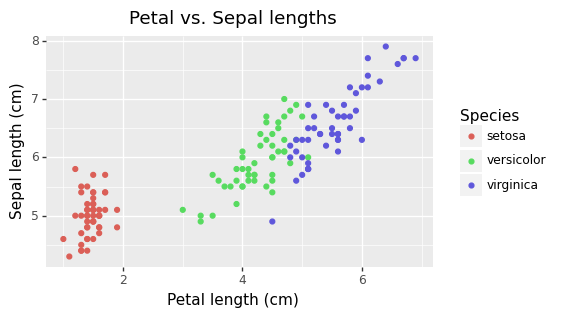

<ggplot: (114041006366)>

In [58]:
# Create
iris_plot = pn.ggplot(data=iris,
                           mapping=pn.aes('petalLength', 'sepalLength',color='factor(species)'))

# Draw the plot
iris_plot + pn.geom_point() \
+ pn.theme(figure_size=(5, 3)) \
+ pn.labs(x='Petal length (cm)', y='Sepal length (cm)', color='Species') \
+ pn.ggtitle('Petal vs. Sepal lengths')

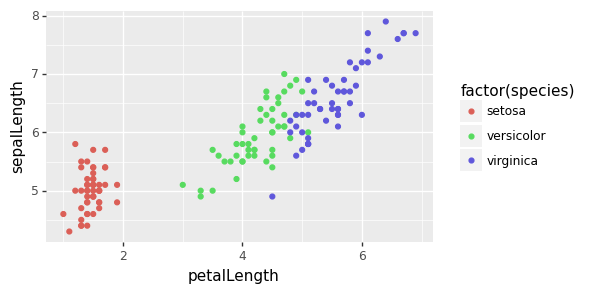

<ggplot: (114040977093)>

In [59]:
(pn.qplot(x='petalLength', y='sepalLength', data=iris, color='factor(species)') 
 + pn.theme(figure_size=(5, 3)))

#### **4.2.1 Barplot**

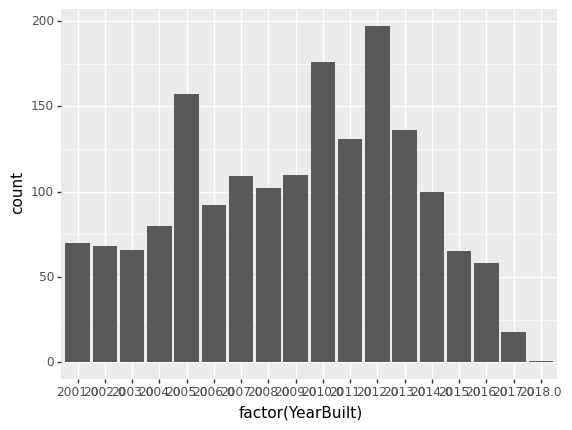

<ggplot: (114041080394)>

In [60]:
houses_gg = houses[houses['YearBuilt'] > 2000].dropna()
pn.ggplot(data=houses_gg,
           mapping=pn.aes(x='factor(YearBuilt)')) \
+ pn.geom_bar()
 

#Notice that we use the year here as a categorical variable by using the factor functionality

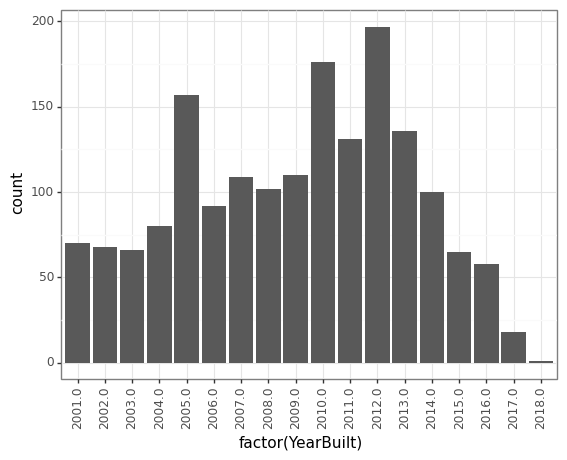

<ggplot: (114042238169)>

In [62]:
#we have the individual year labels overlapping with each other. The theme functionality provides a way to rotate the text of the x-axis labels:
pn.ggplot(data=houses_gg,
           mapping=pn.aes(x='factor(YearBuilt)')) \
+ pn.geom_bar()    \
+ pn.theme_bw() \
+ pn.theme(axis_text_x = pn.element_text(angle=90))

#### **4.2.2 Line chart**

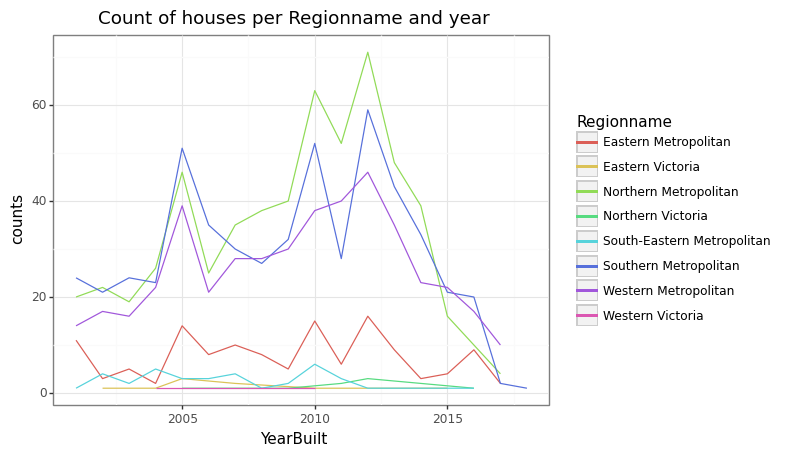

<ggplot: (114042262556)>

In [63]:
yearly_counts = houses_gg.groupby(['YearBuilt', 'Regionname'])['Regionname'].count()
yearly_counts = yearly_counts.reset_index(name='counts')

pn.ggplot(data=yearly_counts,
           mapping=pn.aes(x='YearBuilt',
                          y='counts',
                             color = 'Regionname')) \
+ pn.geom_line() \
+ pn.ggtitle('Count of houses per Regionname and year')\
+ pn.theme_bw()

## **4.3 Advanced Plots**

#### **4.3.1 Boxplot**

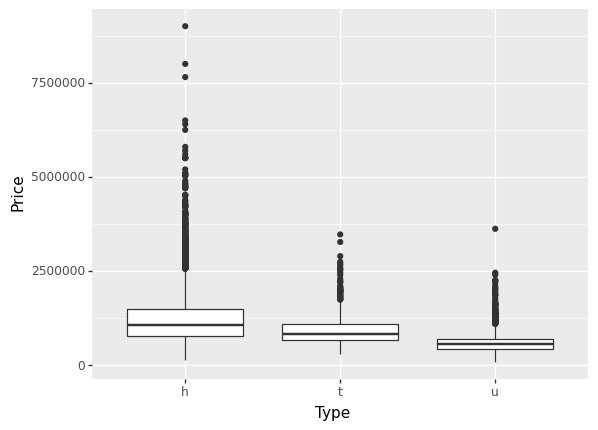

<ggplot: (114042332410)>

In [64]:
pn.ggplot(data=houses,
           mapping=pn.aes(x='Type',
                          y='Price')) \
+ pn.geom_boxplot()

## **4.4 Exercises**

**Exercise 1**

Scatter plot the total_bill vs tips by gender. [tips]

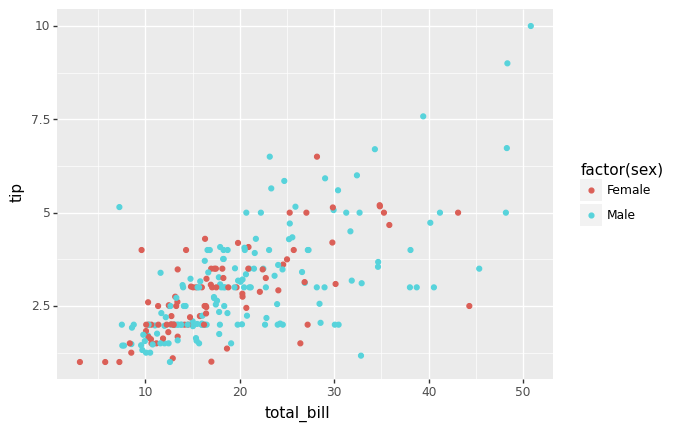

<ggplot: (114042385721)>

In [65]:
(pn.ggplot(tips, pn.aes('total_bill', 'tip', color='factor(sex)'))
+ pn.geom_point())

# **5. GEOPANDAS**

GeoPandas is an open source project to add support for geographic data to pandas objects.

https://geopandas.org/en/stable/

In [66]:
import geopandas as gdp

## **5.1 Map**

In [67]:
file = gdp.datasets.get_path("nybb") #an example shape file in Geopandas package
NY_map= gdp.read_file(file)

In [68]:
NY_map

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [69]:
NY_map = NY_map.set_index('BoroName')

Text(0.5, 1.0, 'New York')

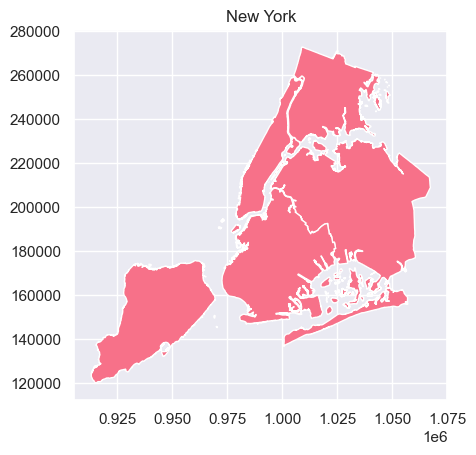

In [70]:
NY_map.plot()
plt.title('New York')

**Add a color based on a variable**

In [71]:
NY_map["area"] = NY_map.area

Text(0.5, 1.0, 'New York')

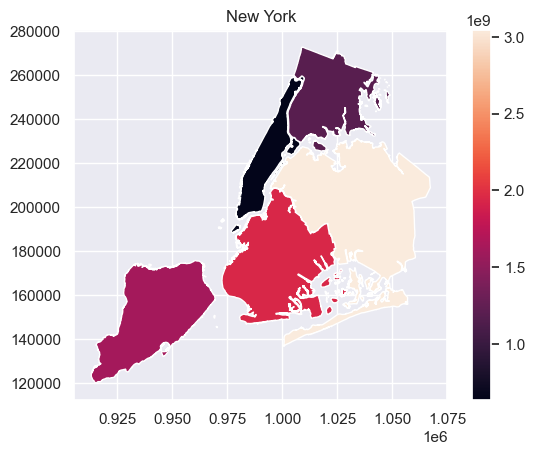

In [72]:
NY_map.plot('area', legend=True)
plt.title('New York')

**Explore the data**

In [59]:
NY_map.explore("area", legend=False)

## **5.2 Exercises**

**Exercise 1**

Make a map of the statistical sectors of Belgium with a color scale of the magnitude of the area. [geo_file]

In [73]:
stat_sect_map = gdp.read_file(geo_file)

In [74]:
stat_sect_map = stat_sect_map[['T_SEC_NL','Shape_Leng', 'Shape_Area', 'geometry']]

In [75]:
stat_sect_map.head(5)

,T_SEC_NL,Shape_Leng,Shape_Area,geometry
0,AARTSELAAR-CENTRUM,5248.125859,531589.560369,"POLYGON Z ((151660.031 203013.606 0.000, 15185..."
1,DE LEEUWERIK,3934.766495,671157.584725,"POLYGON Z ((151748.500 203170.481 0.000, 15173..."
2,BUERSTEDE,2201.733643,280848.157744,"POLYGON Z ((150636.359 202981.934 0.000, 15053..."
3,YSSELAAR,3403.290865,428125.404904,"POLYGON Z ((151584.547 203829.809 0.000, 15152..."
4,KLEINE GRIPPE,2166.474606,255623.657126,"POLYGON Z ((151748.500 203170.481 0.000, 15173..."


Text(0.5, 1.0, 'Belgium')

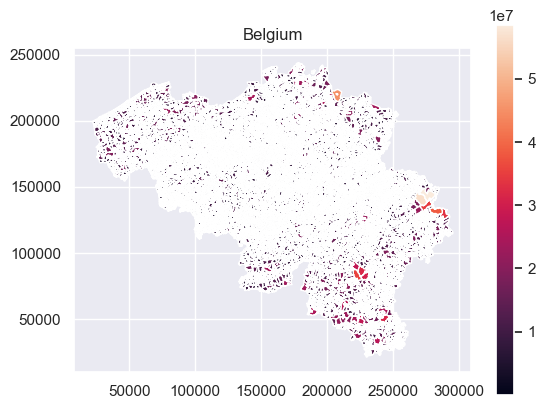

In [76]:
stat_sect_map['area'] = stat_sect_map.area
stat_sect_map.plot('area', legend=True)
plt.title('Belgium')

# **6. NETWORKX**

Description: 
- Based on Matplotlib
- Load and store networks in standard and nonstandard data formats, generate many types of random and classic networks, analyze network structure, build network models, design new network algorithms, draw networks, and much more.

This is used for Graph theory, which is an incredibly potent data science tool that allows you to visualize and understand complex interactions.

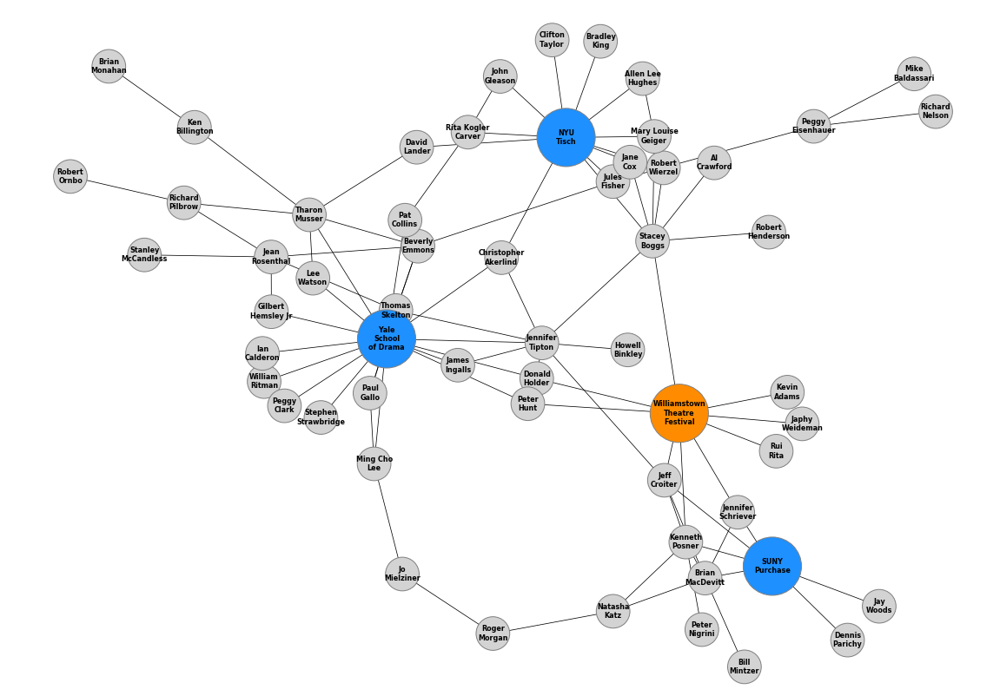

A **Graph** is a collection of nodes (vertices) along with identified pairs of nodes (called edges, links, etc). In NetworkX, nodes can be any hashable object e.g., a text string, an image, an XML object, another Graph, a customized node object, etc.

A **node** represents some object, perhaps a person or organization. 
<br> An **edge** represents the actual connection from one node to another node.

https://networkx.org/documentation/stable/tutorial.html

In [77]:
import networkx as nx

## **6.1 Basic Graph**

#### **6.1.1 Empty Graph**

In [78]:
# Start from an empty graph
G = nx.Graph()

#### **6.1.2 Nodes & edges**
<br>Three ways to add nodes :
- add_node(x) / add_edge(x,y)
- add_nodes_from([x,y]) / add_edges_from ([x,y])
- add_nodes_from(existing network graph) / add_edges_from(existing network graph)

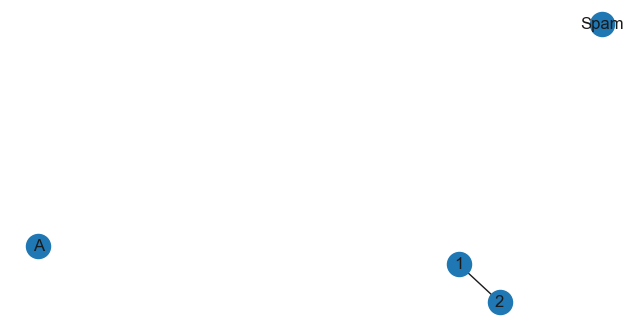

In [79]:
#1) add a single node/edge at once
fig, ax = plt.subplots(figsize=(8,4))

G.add_node('A')
G.add_node('Spam')
G.add_edge(1,2)

nx.draw(G, with_labels = True)

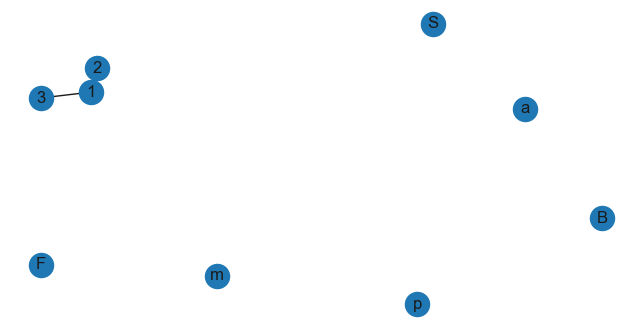

In [80]:
#2) add multiple nodes/edges
G = nx.Graph()
fig, ax = plt.subplots(figsize=(8,4)) 

G.add_nodes_from('Spam')
G.add_nodes_from(['B','F'])
G.add_edges_from([(1, 2), (1, 3)])


nx.draw(G, with_labels = True)

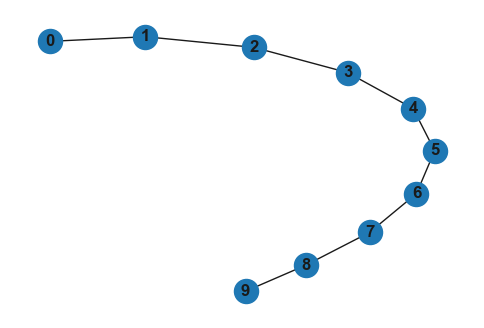

In [81]:
#3)
G = nx.Graph()
H = nx.path_graph(10)

fig, ax = plt.subplots(figsize=(6,4)) 
# G.add_nodes_from(H)
G.add_edges_from(H.edges)

nx.draw(G, with_labels = True, font_weight='bold' )


In [69]:
#if you cant to save your graph
plt.savefig("graph.png") 

<Figure size 640x480 with 0 Axes>

## **6.2 Weighted graph**

In the following example, E is a Python list, which contains five elements. Each of these elements is a Python tuple having three elements. The first two elements denote the two endpoints of an edge and the third element represents the weight of that edge. Finally, we need to add these weighted edges to G

In [82]:
G = nx.Graph() 

E = [('A', 'B', 2), ('A', 'C', 1), ('B', 'D', 5), ('B', 'E', 3), ('C', 'E', 2)]
G.add_weighted_edges_from(E)

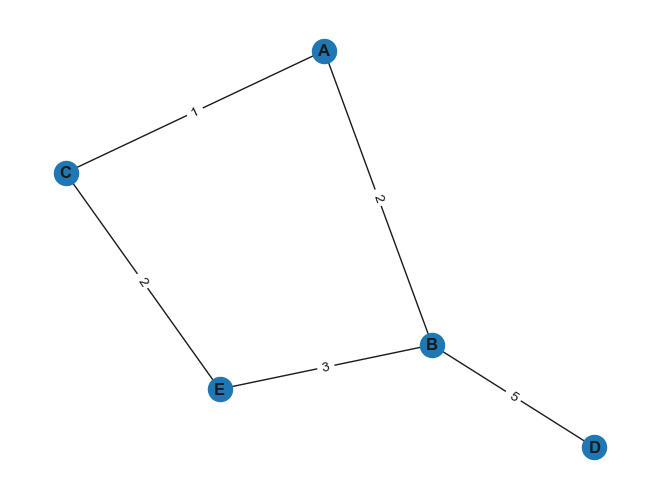

In [83]:
pos=nx.spring_layout(G) #Position nodes using Fruchterman-Reingold force-directed algorithm. The algorithm simulates a force-directed representation of the network treating edges as springs holding nodes close, while treating nodes as repelling objects, sometimes called an anti-gravity force.
#this is needs to be after you build the graph and before you draw it

nx.draw(G, pos, with_labels=True, font_weight='bold')
edge_weight = nx.get_edge_attributes(G,'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels = edge_weight)
plt.show()

## **6.3 Directed graph**

{(1, 2): Text(-0.49161208470176526, 0.11469471747854605, '0.5'),
 (3, 1): Text(0.5, -0.203442851289473, '0.75')}

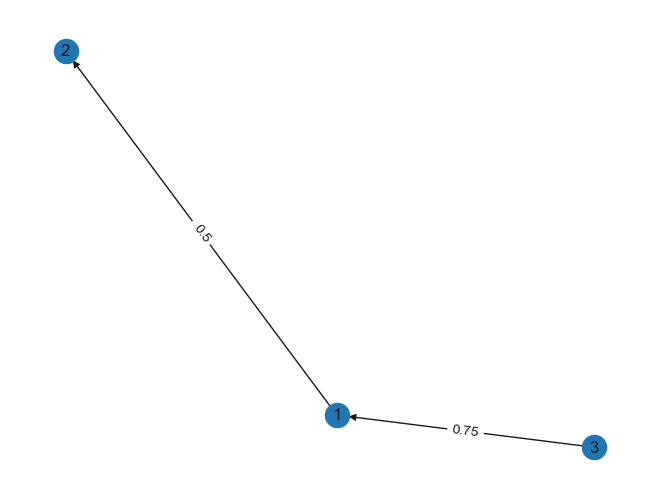

In [85]:
DG = nx.DiGraph()

DG.add_weighted_edges_from([(1, 2, 0.5), (3, 1, 0.75)])
edge_weight = nx.get_edge_attributes(DG,'weight')

pos= nx.spring_layout(DG)
nx.draw(DG, pos, with_labels = True)
nx.draw_networkx_edge_labels(DG, pos, edge_labels = edge_weight)

## **6.4 Organogram**

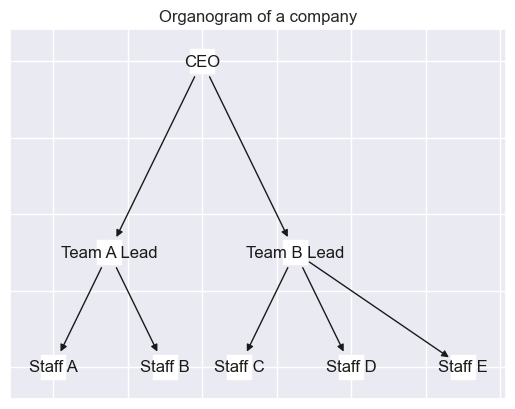

In [86]:
G = nx.DiGraph()

nodes = np.arange(0, 8).tolist() # I added eight nodes to this object starting from 0 to 7 for each of the employees
G.add_nodes_from(nodes)

#I added the edges from the CEO to each of the team leads, and from the team leads to the staff in the corresponding team
G.add_edges_from([(0,1), (0,2),
 (1,3), (1, 4),
 (2, 5), (2, 6), (2,7)]) 

#I set the x and y positions for each node manually inside a dictionary to give it a hierarchical inverted tree-like structure
pos = {0:(10, 10),
 1:(7.5, 7.5), 2:(12.5, 7.5),
 3:(6, 6), 4:(9, 6),
 5:(11, 6), 6:(14, 6), 7:(17, 6)}

#I also assigned labels for each node in the form of a dictionary.
labels = {0:"CEO",
 1:"Team A Lead", 2: "Team B Lead",
 3: "Staff A", 4: "Staff B",
 5: "Staff C", 6: "Staff D", 7: "Staff E"}

nx.draw_networkx(G, pos = pos, labels = labels, arrows = True,
 node_shape = "s", node_color = "white")

plt.title("Organogram of a company")
plt.show()

## **6.5 Useful functions**

In [87]:
print(G.number_of_nodes())
print(G.number_of_edges())

8
7


In [88]:
print(list(G.nodes))
print(list(G.edges))

[0, 1, 2, 3, 4, 5, 6, 7]
[(0, 1), (0, 2), (1, 3), (1, 4), (2, 5), (2, 6), (2, 7)]


In [76]:
G.remove_node(2)
G.remove_nodes_from("spam")

In [89]:
#adding attributes to the nodes
#to the graph: 
G = nx.Graph(day="Friday")
G.graph

{'day': 'Friday'}

In [90]:
# to the nodes:
G.add_node(1, time='5pm')
G.add_nodes_from([3], time='2pm')
G.nodes[3]

{'time': '2pm'}

## **6.6 Exercises**

**Exercise 1**

Try to draw this graph


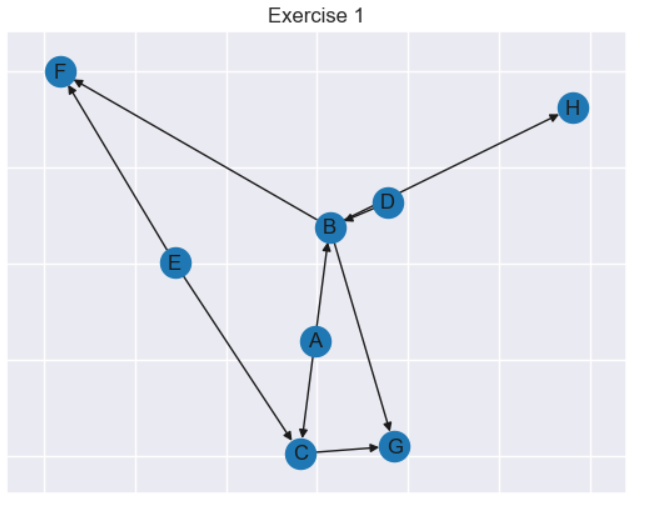


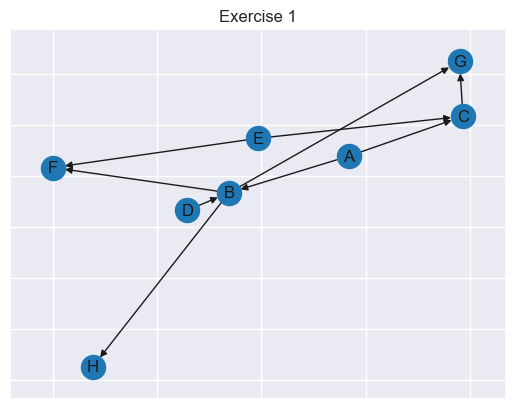

In [79]:
DG = nx.DiGraph()


DG.add_edges_from(
    [('A', 'B'), ('A', 'C'), ('D', 'B'), ('E', 'C'), ('E', 'F'),
     ('B', 'H'), ('B', 'G'), ('B', 'F'), ('C', 'G')])
# edge_weight = nx.get_edge_attributes(DG,'weight')
pos = nx.spring_layout(DG)

nx.draw_networkx_nodes(DG, pos)
nx.draw_networkx_labels(DG, pos)
nx.draw_networkx_edges(DG, pos, arrows = True)

plt.title('Exercise 1')
plt.show()